# Customer Churn in Wiretel

### The data set contains 20 predictors worth of information about 3333 customers of Wiretel, along with the target variable, churn, an indication of whether that customer churned (left the company) or not. 

In [2]:
#import the required libraries
import numpy as np
import pandas as pd
import pandas_profiling
import seaborn as sns
import matplotlib.ticker as mtick
import matplotlib.pyplot as plt
%matplotlib inline


C:\Users\manan\AppData\Local\Temp\ipykernel_4888\3538598444.py:4: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  import pandas_profiling


In [3]:
pandas_profiling.ProfileReport(pd.read_excel(r'\Users\manan\Desktop\vrn trash\data science\project 1 -model to predict the house prices\Wiretel_Churn data.xlsx'))

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [4]:
telco_base_data= pd.read_excel(r'\Users\manan\Desktop\vrn trash\data science\project 1 -model to predict the house prices\Wiretel_Churn data.xlsx')

In [5]:
telco_base_data.head()

,State,Account_Length,Area_Code,Phone,Intl_Plan,Vmail_Plan,Vmail_Message,Day_Mins,Day_Calls,Day_Charge,...,Eve_Calls,Eve_Charge,Night_Mins,Night_Calls,Night_Charge,Intl_Mins,Intl_Calls,Intl_Charge,CustServ_Calls,Churn
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,...,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False.
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,...,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False.
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,...,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False.
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.90,...,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False.
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,...,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False.


### Checking attributes like shape, datatypes, value counts etc. to get better understanding of data.

In [6]:
telco_base_data.shape

(3333, 21)

In [7]:
telco_base_data.columns.values

array(['State', 'Account_Length', 'Area_Code', 'Phone', 'Intl_Plan',
       'Vmail_Plan', 'Vmail_Message', 'Day_Mins', 'Day_Calls',
       'Day_Charge', 'Ev_ Mins', 'Eve_Calls', 'Eve_Charge', 'Night_Mins',
       'Night_Calls', 'Night_Charge', 'Intl_Mins', 'Intl_Calls',
       'Intl_Charge', 'CustServ_Calls', 'Churn'], dtype=object)

In [8]:
telco_base_data.dtypes

State              object
Account_Length      int64
Area_Code           int64
Phone              object
Intl_Plan          object
Vmail_Plan         object
Vmail_Message       int64
Day_Mins          float64
Day_Calls           int64
Day_Charge        float64
Ev_ Mins          float64
Eve_Calls           int64
Eve_Charge        float64
Night_Mins        float64
Night_Calls         int64
Night_Charge      float64
Intl_Mins         float64
Intl_Calls          int64
Intl_Charge       float64
CustServ_Calls      int64
Churn              object
dtype: object

In [9]:
telco_base_data.describe() #checking the descriptive statistics of numeric variables

,Account_Length,Area_Code,Vmail_Message,Day_Mins,Day_Calls,Day_Charge,Ev_ Mins,Eve_Calls,Eve_Charge,Night_Mins,Night_Calls,Night_Charge,Intl_Mins,Intl_Calls,Intl_Charge,CustServ_Calls
count,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000
mean,101.064806,437.182418,8.099010,179.775098,100.435644,30.562307,200.980348,100.114311,17.083540,200.872037,100.107711,9.039325,10.237294,4.479448,2.764581,1.562856
std,39.822106,42.371290,13.688365,54.467389,20.069084,9.259435,50.713844,19.922625,4.310668,50.573847,19.568609,2.275873,2.791840,2.461214,0.753773,1.315491
min,1.000000,408.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,23.200000,33.000000,1.040000,0.000000,0.000000,0.000000,0.000000
25%,74.000000,408.000000,0.000000,143.700000,87.000000,24.430000,166.600000,87.000000,14.160000,167.000000,87.000000,7.520000,8.500000,3.000000,2.300000,1.000000
50%,101.000000,415.000000,0.000000,179.400000,101.000000,30.500000,201.400000,100.000000,17.120000,201.200000,100.000000,9.050000,10.300000,4.000000,2.780000,1.000000
75%,127.000000,510.000000,20.000000,216.400000,114.000000,36.790000,235.300000,114.000000,20.000000,235.300000,113.000000,10.590000,12.100000,6.000000,3.270000,2.000000
max,243.000000,510.000000,51.000000,350.800000,165.000000,59.640000,363.700000,170.000000,30.910000,395.000000,175.000000,17.770000,20.000000,20.000000,5.400000,9.000000


In [10]:
#custServ_calls 75% and max cals has more than 4x difference, mean aslo have more than 5x difference
#intl_calls- 75% and max has more than 3x difference, mean have 4x difference

In [11]:
#finding the exact value and percentage of churners

In [12]:
telco_base_data['Churn'].value_counts()

False.    2850
True.      483
Name: Churn, dtype: int64

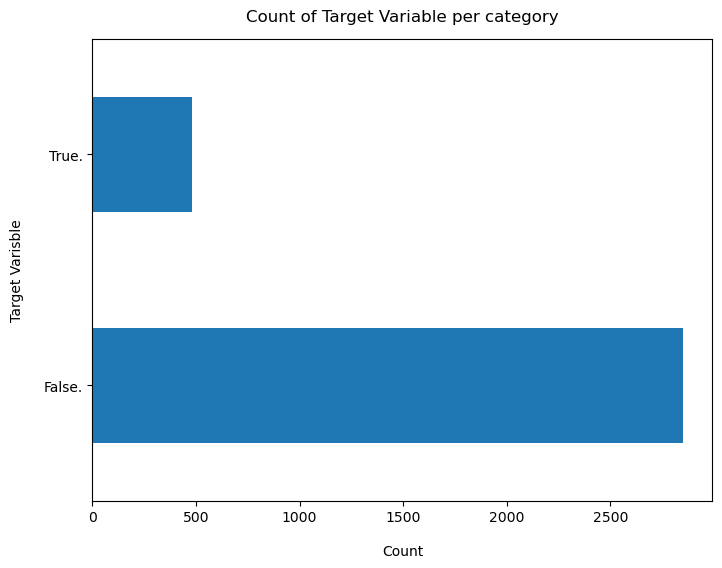

In [13]:
telco_base_data['Churn'].value_counts().plot(kind='barh', figsize=(8,6))
plt.xlabel("Count", labelpad=14)
plt.ylabel("Target Varisble", labelpad=14)
plt.title("Count of Target Variable per category", y=1.02);

In [14]:
100*telco_base_data['Churn'].value_counts()/len(telco_base_data['Churn'])

False.    85.508551
True.     14.491449
Name: Churn, dtype: float64

In [15]:
#the dataset is highly imbalance, ratio= 85.5:14.5
#we analyse the data with other features while taking the target values seperately to get some insights.

In [16]:
#now balance the data either by upsampling or downsampling 

In [17]:
# Concise Summary of the dataframe, as we have too many columns, we are using thr verbose=True mode
telco_base_data.info(verbose = True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   State           3333 non-null   object 
 1   Account_Length  3333 non-null   int64  
 2   Area_Code       3333 non-null   int64  
 3   Phone           3333 non-null   object 
 4   Intl_Plan       3333 non-null   object 
 5   Vmail_Plan      3333 non-null   object 
 6   Vmail_Message   3333 non-null   int64  
 7   Day_Mins        3333 non-null   float64
 8   Day_Calls       3333 non-null   int64  
 9   Day_Charge      3333 non-null   float64
 10  Ev_ Mins        3333 non-null   float64
 11  Eve_Calls       3333 non-null   int64  
 12  Eve_Charge      3333 non-null   float64
 13  Night_Mins      3333 non-null   float64
 14  Night_Calls     3333 non-null   int64  
 15  Night_Charge    3333 non-null   float64
 16  Intl_Mins       3333 non-null   float64
 17  Intl_Calls      3333 non-null   i

C:\Users\manan\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


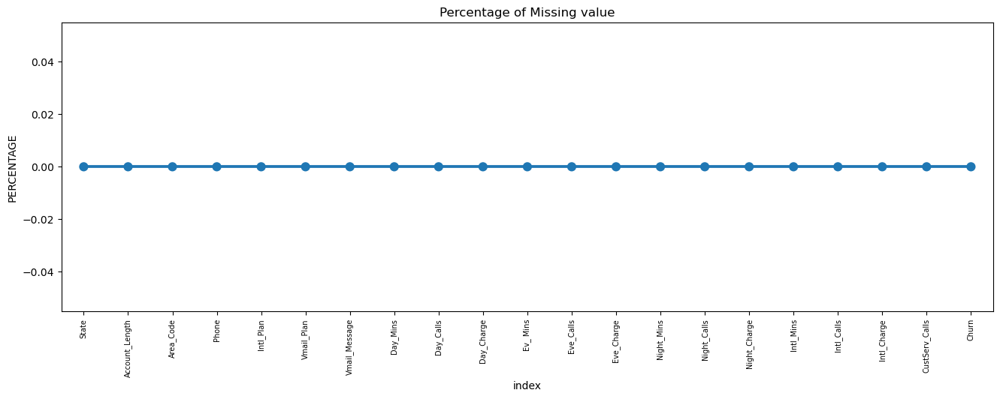

In [18]:
missing = pd.DataFrame((telco_base_data.isnull().sum())*100/telco_base_data.shape[0]).reset_index()
plt.figure(figsize=(16,5))
ax=sns.pointplot('index',0,data=missing)
plt.xticks(rotation = 90, fontsize = 7)
plt.title("Percentage of Missing value")
plt.ylabel("PERCENTAGE")
plt.show()
#for finding the percentage of missing value

In [19]:
#here we don't have missing values

In [20]:
for column in telco_base_data:
    if telco_base_data[column].dtype=='object':
        print(f'{column} : {telco_base_data[column].unique()}')

State : ['KS' 'OH' 'NJ' 'OK' 'AL' 'MA' 'MO' 'LA' 'WV' 'IN' 'RI' 'IA' 'MT' 'NY'
 'ID' 'VT' 'VA' 'TX' 'FL' 'CO' 'AZ' 'SC' 'NE' 'WY' 'HI' 'IL' 'NH' 'GA'
 'AK' 'MD' 'AR' 'WI' 'OR' 'MI' 'DE' 'UT' 'CA' 'MN' 'SD' 'NC' 'WA' 'NM'
 'NV' 'DC' 'KY' 'ME' 'MS' 'TN' 'PA' 'CT' 'ND']
Phone : ['382-4657' '371-7191' '358-1921' ... '328-8230' '364-6381' '400-4344']
Intl_Plan : ['no' 'yes']
Vmail_Plan : ['yes' 'no']
Churn : ['False.' 'True.']


In [21]:
#state- convert into dummy variables
#phone- drop as it is a unique-id
#Intl_Plan, Vmail_Plan, Churn - convert into boolean

## Data cleaning

### 1- Create a copy of base data for manupulation and processing

In [22]:
telco_data = telco_base_data.copy()

### 2- Charges should be numeric amount. Let's convert it to numerical data type

In [23]:
telco_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   State           3333 non-null   object 
 1   Account_Length  3333 non-null   int64  
 2   Area_Code       3333 non-null   int64  
 3   Phone           3333 non-null   object 
 4   Intl_Plan       3333 non-null   object 
 5   Vmail_Plan      3333 non-null   object 
 6   Vmail_Message   3333 non-null   int64  
 7   Day_Mins        3333 non-null   float64
 8   Day_Calls       3333 non-null   int64  
 9   Day_Charge      3333 non-null   float64
 10  Ev_ Mins        3333 non-null   float64
 11  Eve_Calls       3333 non-null   int64  
 12  Eve_Charge      3333 non-null   float64
 13  Night_Mins      3333 non-null   float64
 14  Night_Calls     3333 non-null   int64  
 15  Night_Charge    3333 non-null   float64
 16  Intl_Mins       3333 non-null   float64
 17  Intl_Calls      3333 non-null   i

In [24]:
telco_data['Intl_Plan'] = telco_data['Intl_Plan'].apply(lambda x: 1 if x == 'yes' else 0)
telco_data['Vmail_Plan'] = telco_data['Vmail_Plan'].apply(lambda x: 1 if x == 'yes' else 0)
telco_data.drop(columns=['Phone'], axis=1, inplace=True)
telco_data.head(10)

,State,Account_Length,Area_Code,Intl_Plan,Vmail_Plan,Vmail_Message,Day_Mins,Day_Calls,Day_Charge,Ev_ Mins,Eve_Calls,Eve_Charge,Night_Mins,Night_Calls,Night_Charge,Intl_Mins,Intl_Calls,Intl_Charge,CustServ_Calls,Churn
0,KS,128,415,0,1,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False.
1,OH,107,415,0,1,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False.
2,NJ,137,415,0,0,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False.
3,OH,84,408,1,0,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False.
4,OK,75,415,1,0,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False.
5,AL,118,510,1,0,0,223.4,98,37.98,220.6,101,18.75,203.9,118,9.18,6.3,6,1.70,0,False.
6,MA,121,510,0,1,24,218.2,88,37.09,348.5,108,29.62,212.6,118,9.57,7.5,7,2.03,3,False.
7,MO,147,415,1,0,0,157.0,79,26.69,103.1,94,8.76,211.8,96,9.53,7.1,6,1.92,0,False.
8,LA,117,408,0,0,0,184.5,97,31.37,351.6,80,29.89,215.8,90,9.71,8.7,4,2.35,1,False.
9,WV,141,415,1,1,37,258.6,84,43.96,222.0,111,18.87,326.4,97,14.69,11.2,5,3.02,0,False.


In [25]:
telco_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 20 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   State           3333 non-null   object 
 1   Account_Length  3333 non-null   int64  
 2   Area_Code       3333 non-null   int64  
 3   Intl_Plan       3333 non-null   int64  
 4   Vmail_Plan      3333 non-null   int64  
 5   Vmail_Message   3333 non-null   int64  
 6   Day_Mins        3333 non-null   float64
 7   Day_Calls       3333 non-null   int64  
 8   Day_Charge      3333 non-null   float64
 9   Ev_ Mins        3333 non-null   float64
 10  Eve_Calls       3333 non-null   int64  
 11  Eve_Charge      3333 non-null   float64
 12  Night_Mins      3333 non-null   float64
 13  Night_Calls     3333 non-null   int64  
 14  Night_Charge    3333 non-null   float64
 15  Intl_Mins       3333 non-null   float64
 16  Intl_Calls      3333 non-null   int64  
 17  Intl_Charge     3333 non-null   f

In [26]:
tel_viz=telco_data.copy()

## Creating bins for better visualisation

### Day Charge group

In [27]:
#Divide the customer into bins 
# get the max Account_Length
print(tel_viz['Day_Charge'].max())

59.64


In [28]:
# Group the Day_Charge in bins of 10
labels = ["{0} - {1}".format(i, i + 9) for i in range(1,61,10)]

tel_viz['Day_Charge_group'] = pd.cut(tel_viz.Day_Charge, range(1,70,10), right=False, labels=labels)

In [29]:
tel_viz['Day_Charge_group'].value_counts()

21 - 30    1242
31 - 40    1178
11 - 20     417
41 - 50     383
1 - 10       67
51 - 60      43
Name: Day_Charge_group, dtype: int64

### Evening Charge Group

In [30]:
#Divide the customer into bins 
# get the max Eve_Charge
print(tel_viz['Eve_Charge'].max())

30.91


In [31]:
# Group the Eve_Charge in bins of 24
labels = ["{0} - {1}".format(i, i + 4) for i in range(1,36,5)]

tel_viz['Eve_Charge_group'] = pd.cut(tel_viz.Eve_Charge, range(1,40,5), right=False, labels=labels)
tel_viz['Eve_Charge_group'].value_counts()

16 - 20    1375
11 - 15    1081
21 - 25     560
6 - 10      232
26 - 30      64
1 - 5        20
31 - 35       0
Name: Eve_Charge_group, dtype: int64

### Night Charge Group

In [32]:
#Divide the customer into bins 
# get the max Night_Charge
print(tel_viz['Night_Charge'].max())

17.77


In [33]:
# Group the Night_Charge in bins of 4
labels = ["{0} - {1}".format(i, i + 2) for i in range(1,19,3)]

tel_viz['Night_Charge_group'] = pd.cut(tel_viz.Night_Charge, range(1,21,3), right=False, labels=labels)
tel_viz['Night_Charge_group'].value_counts()

7 - 9      1583
10 - 12     996
4 - 6       575
13 - 15     126
1 - 3        47
16 - 18       6
Name: Night_Charge_group, dtype: int64

### Intl_Charge group

In [34]:
#Divide the customer into bins based on tenure
# get the max Intl_Charge
print(tel_viz['Intl_Charge'].max())

5.4


In [35]:
# Group the Intl_Charge in bins of 0.5
labels = ["{0} - {1}".format(i, i + 1) for i in range(1,7,2)]

tel_viz['Intl_Charge_group'] = pd.cut(tel_viz.Intl_Charge, range(1,8,2), right=False, labels=labels)
tel_viz['Intl_Charge_group'].value_counts()

1 - 2    1983
3 - 4    1307
5 - 6       2
Name: Intl_Charge_group, dtype: int64

### Account length group 

In [36]:
#Divide the customer into bins 
# get the max Account_Length
print(tel_viz['Account_Length'].max())

243


In [37]:
# Group the Account_Length in bins of 24
labels = ["{0} - {1}".format(i, i + 23) for i in range(1,221,24)]

tel_viz['Account_Length_group'] = pd.cut(tel_viz.Account_Length, range(1,245,24), right=False, labels=labels)



In [38]:
tel_viz['Account_Length_group'].value_counts()

97 - 120     765
73 - 96      737
121 - 144    575
49 - 72      474
145 - 168    304
25 - 48      225
169 - 192    117
1 - 24        94
193 - 216     33
217 - 240      8
Name: Account_Length_group, dtype: int64

In [39]:
#drop column Day_Charge,Eve_Charge,Night_Charge,Intl_Charge and Account_Length
tel_viz.drop(columns=['Account_Length','Day_Charge','Eve_Charge','Night_Charge','Intl_Charge'], axis=1, inplace=True)
tel_viz.head()

,State,Area_Code,Intl_Plan,Vmail_Plan,Vmail_Message,Day_Mins,Day_Calls,Ev_ Mins,Eve_Calls,Night_Mins,Night_Calls,Intl_Mins,Intl_Calls,CustServ_Calls,Churn,Day_Charge_group,Eve_Charge_group,Night_Charge_group,Intl_Charge_group,Account_Length_group
0,KS,415,0,1,25,265.1,110,197.4,99,244.7,91,10.0,3,1,False.,41 - 50,16 - 20,10 - 12,1 - 2,121 - 144
1,OH,415,0,1,26,161.6,123,195.5,103,254.4,103,13.7,3,1,False.,21 - 30,16 - 20,10 - 12,3 - 4,97 - 120
2,NJ,415,0,0,0,243.4,114,121.2,110,162.6,104,12.2,5,0,False.,41 - 50,6 - 10,7 - 9,3 - 4,121 - 144
3,OH,408,1,0,0,299.4,71,61.9,88,196.9,89,6.6,7,2,False.,41 - 50,1 - 5,7 - 9,1 - 2,73 - 96
4,OK,415,1,0,0,166.7,113,148.3,122,186.9,121,10.1,3,3,False.,21 - 30,11 - 15,7 - 9,1 - 2,73 - 96


# Data Exploration

### plot distibution of individual predictor by churn 

## Univariate Analysis

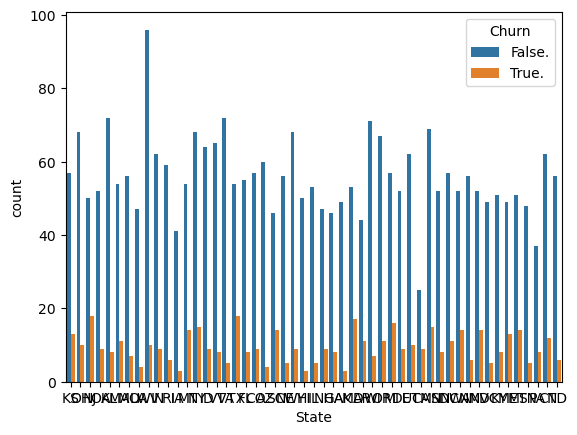

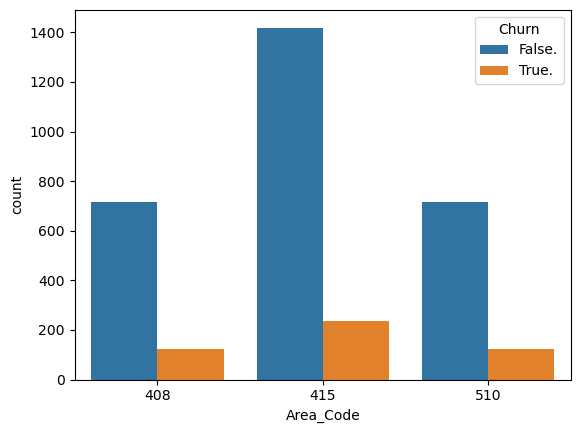

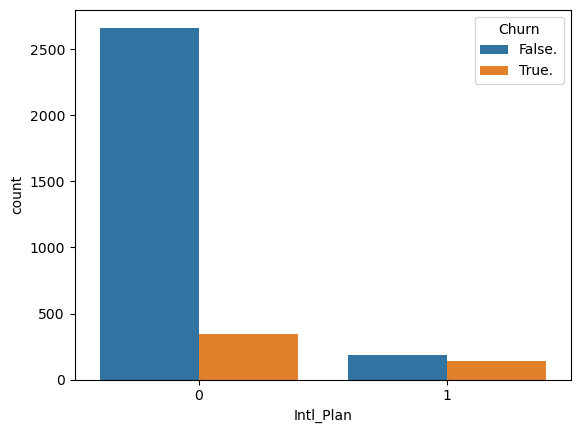

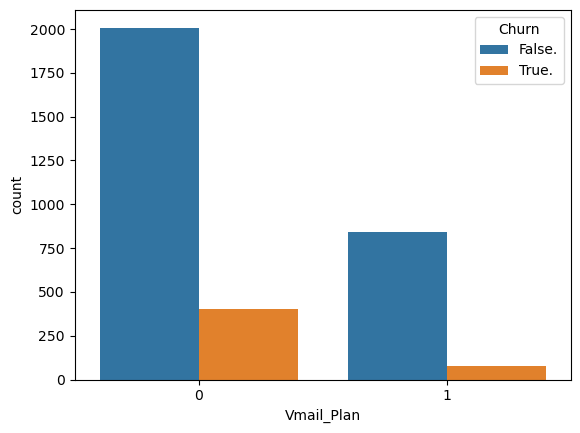

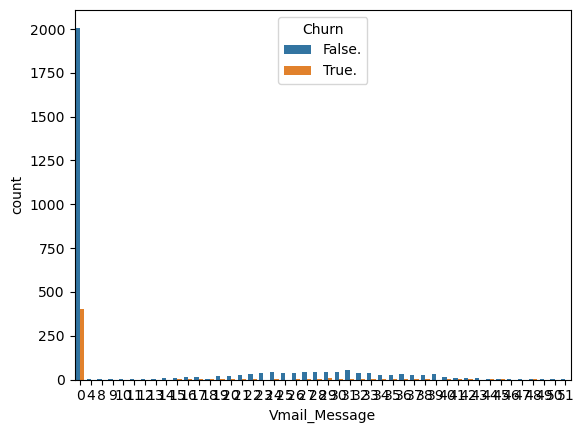

...

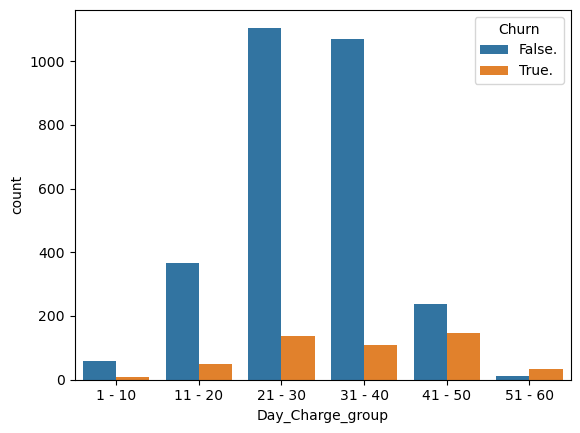

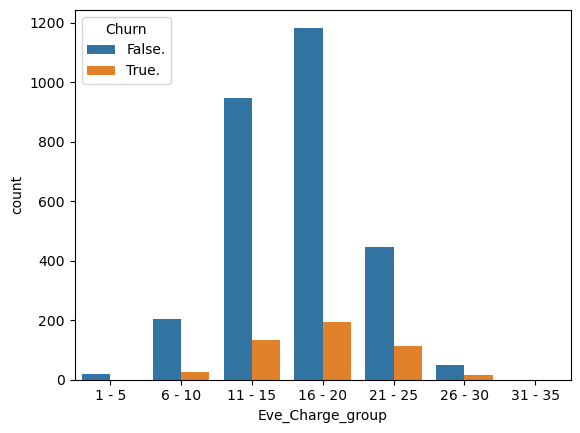

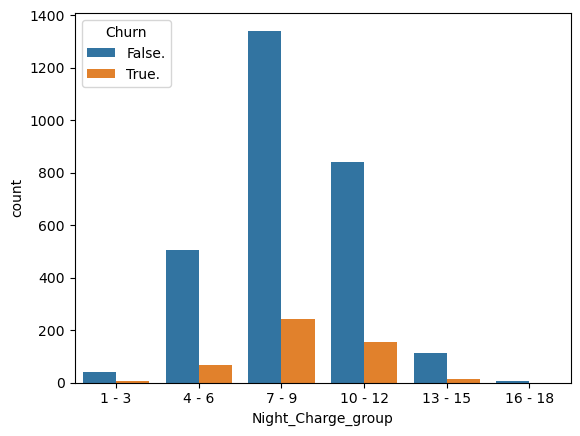

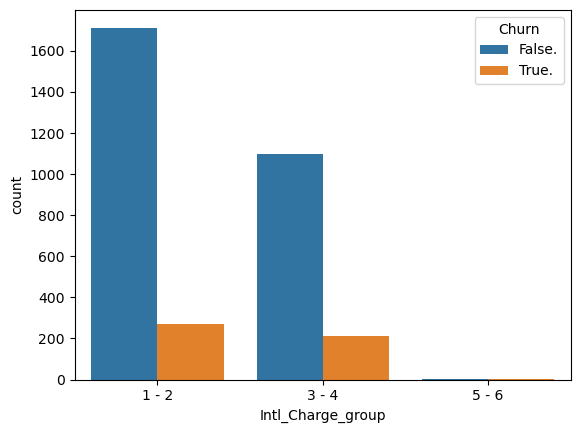

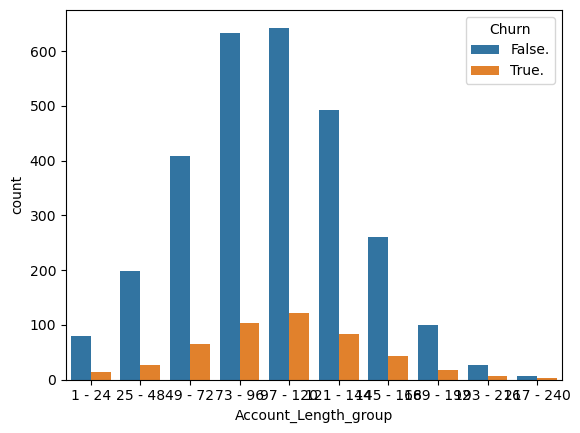

In [40]:
for i,predictor in enumerate(tel_viz.drop(columns=['Churn'])):
    plt.figure(i)
    sns.countplot(data=tel_viz, x=predictor, hue='Churn')

In [41]:
# Though the number is less but people having international plan are more likely to churn.
# people who call the customer service more than 4 times are more likely to be churn
# people having day charges more than 50 are more likely to churn.

In [42]:
#similarly we can create bins for different columns which have continous variables to get better visualisation

###  Convert the target variable 'Churn' in a binary numeric variable i.e. True=1 ; False=0 

In [43]:

telco_data['Churn'] = telco_data['Churn'].apply(lambda x: 1 if x == 'True.' else 0)
telco_data.head(30)



,State,Account_Length,Area_Code,Intl_Plan,Vmail_Plan,Vmail_Message,Day_Mins,Day_Calls,Day_Charge,Ev_ Mins,Eve_Calls,Eve_Charge,Night_Mins,Night_Calls,Night_Charge,Intl_Mins,Intl_Calls,Intl_Charge,CustServ_Calls,Churn
0,KS,128,415,0,1,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,0
1,OH,107,415,0,1,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,0
2,NJ,137,415,0,0,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,0
3,OH,84,408,1,0,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,0
4,OK,75,415,1,0,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,0
5,AL,118,510,1,0,0,223.4,98,37.98,220.6,101,18.75,203.9,118,9.18,6.3,6,1.70,0,0
6,MA,121,510,0,1,24,218.2,88,37.09,348.5,108,29.62,212.6,118,9.57,7.5,7,2.03,3,0
7,MO,147,415,1,0,0,157.0,79,26.69,103.1,94,8.76,211.8,96,9.53,7.1,6,1.92,0,0
8,LA,117,408,0,0,0,184.5,97,31.37,351.6,80,29.89,215.8,90,9.71,8.7,4,2.35,1,0
9,WV,141,415,1,1,37,258.6,84,43.96,222.0,111,18.87,326.4,97,14.69,11.2,5,3.02,0,0


array([[<AxesSubplot:title={'center':'Account_Length'}>,
        <AxesSubplot:title={'center':'Area_Code'}>,
        <AxesSubplot:title={'center':'Intl_Plan'}>,
        <AxesSubplot:title={'center':'Vmail_Plan'}>],
       [<AxesSubplot:title={'center':'Vmail_Message'}>,
        <AxesSubplot:title={'center':'Day_Mins'}>,
        <AxesSubplot:title={'center':'Day_Calls'}>,
        <AxesSubplot:title={'center':'Day_Charge'}>],
       [<AxesSubplot:title={'center':'Ev_ Mins'}>,
        <AxesSubplot:title={'center':'Eve_Calls'}>,
        <AxesSubplot:title={'center':'Eve_Charge'}>,
        <AxesSubplot:title={'center':'Night_Mins'}>],
       [<AxesSubplot:title={'center':'Night_Calls'}>,
        <AxesSubplot:title={'center':'Night_Charge'}>,
        <AxesSubplot:title={'center':'Intl_Mins'}>,
        <AxesSubplot:title={'center':'Intl_Calls'}>],
       [<AxesSubplot:title={'center':'Intl_Charge'}>,
        <AxesSubplot:title={'center':'CustServ_Calls'}>,
        <AxesSubplot:title={'center'

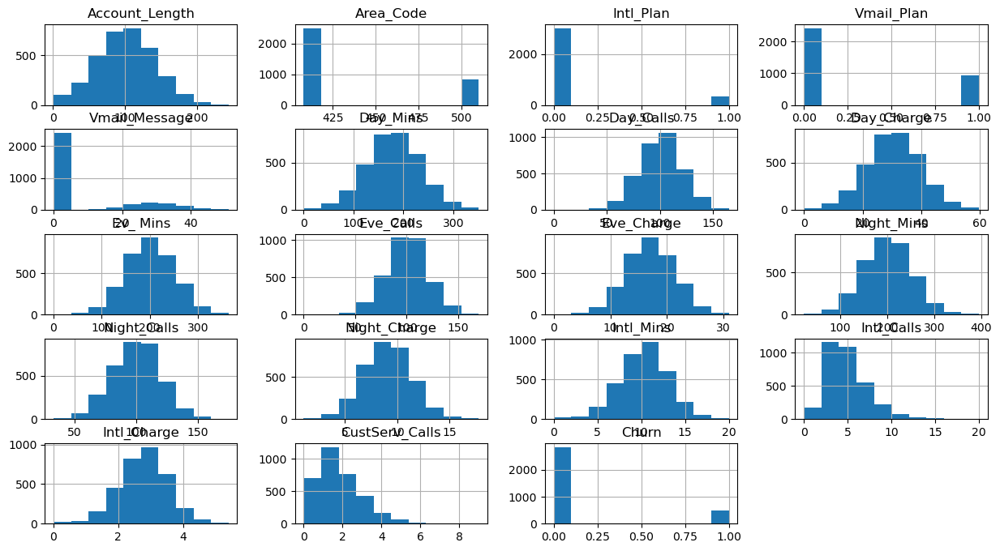

In [44]:
telco_data.hist(figsize=(15,8))

In [45]:
telco_data.corr()

,Account_Length,Area_Code,Intl_Plan,Vmail_Plan,Vmail_Message,Day_Mins,Day_Calls,Day_Charge,Ev_ Mins,Eve_Calls,Eve_Charge,Night_Mins,Night_Calls,Night_Charge,Intl_Mins,Intl_Calls,Intl_Charge,CustServ_Calls,Churn
Account_Length,1.000000,-0.012463,0.024735,0.002918,-0.004628,0.006216,0.038470,0.006214,-0.006757,0.019260,-0.006745,-0.008955,-0.013176,-0.008960,0.009514,0.020661,0.009546,-0.003796,0.016541
Area_Code,-0.012463,1.000000,0.048551,-0.000747,-0.001994,-0.008264,-0.009646,-0.008264,0.003580,-0.011886,0.003607,-0.005825,0.016522,-0.005845,-0.018288,-0.024179,-0.018395,0.027572,0.006174
Intl_Plan,0.024735,0.048551,1.000000,0.006006,0.008745,0.049396,0.003755,0.049398,0.019100,0.006114,0.019106,-0.028905,0.012451,-0.028913,0.045871,0.017366,0.045780,-0.024522,0.259852
Vmail_Plan,0.002918,-0.000747,0.006006,1.000000,0.956927,-0.001684,-0.011086,-0.001686,0.021545,-0.006444,0.021559,0.006079,0.015553,0.006064,-0.001318,0.007618,-0.001276,-0.017824,-0.102148
Vmail_Message,-0.004628,-0.001994,0.008745,0.956927,1.000000,0.000778,-0.009548,0.000776,0.017562,-0.005864,0.017578,0.007681,0.007123,0.007663,0.002856,0.013957,0.002884,-0.013263,-0.089728
Day_Mins,0.006216,-0.008264,0.049396,-0.001684,0.000778,1.000000,0.006750,1.000000,0.007043,0.015769,0.007029,0.004323,0.022972,0.004300,-0.010155,0.008033,-0.010092,-0.013423,0.205151
Day_Calls,0.038470,-0.009646,0.003755,-0.011086,-0.009548,0.006750,1.000000,0.006753,-0.021451,0.006462,-0.021449,0.022938,-0.019557,0.022927,0.021565,0.004574,0.021666,-0.018942,0.018459
Day_Charge,0.006214,-0.008264,0.049398,-0.001686,0.000776,1.000000,0.006753,1.000000,0.007050,0.015769,0.007036,0.004324,0.022972,0.004301,-0.010157,0.008032,-0.010094,-0.013427,0.205151
Ev_ Mins,-0.006757,0.003580,0.019100,0.021545,0.017562,0.007043,-0.021451,0.007050,1.000000,-0.011430,1.000000,-0.012584,0.007586,-0.012593,-0.011035,0.002541,-0.011067,-0.012985,0.092796
Eve_Calls,0.019260,-0.011886,0.006114,-0.006444,-0.005864,0.015769,0.006462,0.015769,-0.011430,1.000000,-0.011423,-0.002093,0.007710,-0.002056,0.008703,0.017434,0.008674,0.002423,0.009233


<AxesSubplot:>

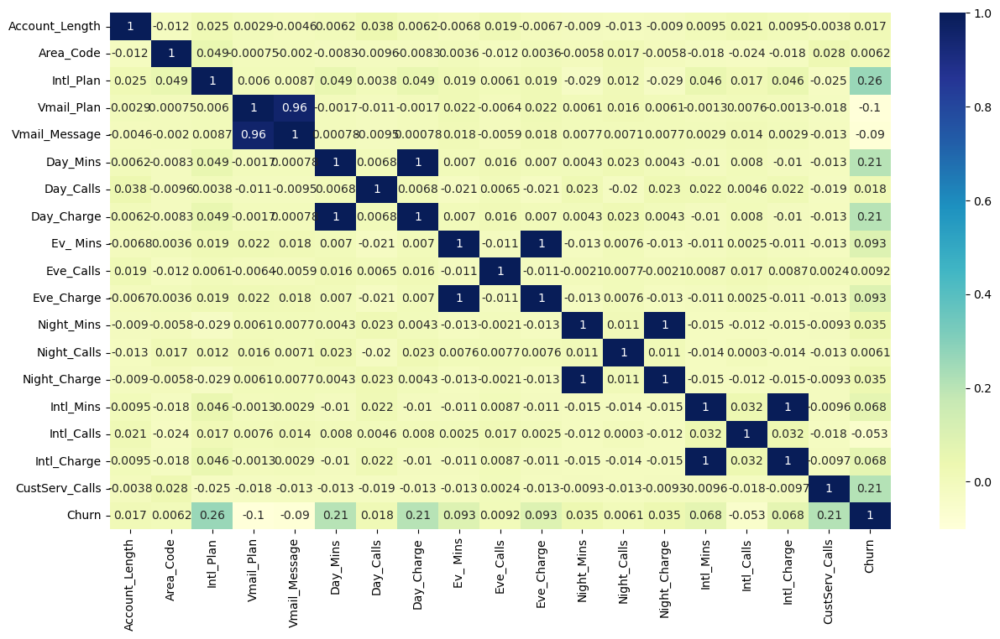

In [46]:
plt.figure(figsize=(15,8))
sns.heatmap(telco_data.corr(), annot=True, cmap="YlGnBu")

In [47]:
corr_matrix= telco_data.corr()
corr_matrix["Churn"].sort_values(ascending=False)

Churn             1.000000
Intl_Plan         0.259852
CustServ_Calls    0.208750
Day_Mins          0.205151
Day_Charge        0.205151
Ev_ Mins          0.092796
Eve_Charge        0.092786
Intl_Charge       0.068259
Intl_Mins         0.068239
Night_Charge      0.035496
Night_Mins        0.035493
Day_Calls         0.018459
Account_Length    0.016541
Eve_Calls         0.009233
Area_Code         0.006174
Night_Calls       0.006141
Intl_Calls       -0.052844
Vmail_Message    -0.089728
Vmail_Plan       -0.102148
Name: Churn, dtype: float64

### 3- Convert all the categorical variables into dummy variables (one hot encoding)

In [48]:
telco_data.State.value_counts() 

WV    106
MN     84
NY     83
AL     80
WI     78
OH     78
OR     78
WY     77
VA     77
CT     74
MI     73
ID     73
VT     73
TX     72
UT     72
IN     71
MD     70
KS     70
NC     68
NJ     68
MT     68
CO     66
NV     66
WA     66
RI     65
MA     65
MS     65
AZ     64
FL     63
MO     63
NM     62
ME     62
ND     62
NE     61
OK     61
DE     61
SC     60
SD     60
KY     59
IL     58
NH     56
AR     55
GA     54
DC     54
HI     53
TN     53
AK     52
LA     51
PA     45
IA     44
CA     34
Name: State, dtype: int64

In [56]:
#creating dummy variables (one hot encoding)
pd.get_dummies(telco_data['State']).head(10)

,AK,AL,AR,AZ,CA,CO,CT,DC,DE,FL,...,SD,TN,TX,UT,VA,VT,WA,WI,WV,WY
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0


In [50]:
telco_data.drop('State', axis=1).head()

,Account_Length,Area_Code,Intl_Plan,Vmail_Plan,Vmail_Message,Day_Mins,Day_Calls,Day_Charge,Ev_ Mins,Eve_Calls,Eve_Charge,Night_Mins,Night_Calls,Night_Charge,Intl_Mins,Intl_Calls,Intl_Charge,CustServ_Calls,Churn
0,128,415,0,1,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,0
1,107,415,0,1,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,0
2,137,415,0,0,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,0
3,84,408,1,0,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,0
4,75,415,1,0,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,0


In [51]:
telco_data_dummies = pd.concat([telco_data.drop('State', axis=1),
                              pd.get_dummies(telco_data['State'])],axis=1)
telco_data_dummies

,Account_Length,Area_Code,Intl_Plan,Vmail_Plan,Vmail_Message,Day_Mins,Day_Calls,Day_Charge,Ev_ Mins,Eve_Calls,...,SD,TN,TX,UT,VA,VT,WA,WI,WV,WY
0,128,415,0,1,25,265.1,110,45.07,197.4,99,...,0,0,0,0,0,0,0,0,0,0
1,107,415,0,1,26,161.6,123,27.47,195.5,103,...,0,0,0,0,0,0,0,0,0,0
2,137,415,0,0,0,243.4,114,41.38,121.2,110,...,0,0,0,0,0,0,0,0,0,0
3,84,408,1,0,0,299.4,71,50.90,61.9,88,...,0,0,0,0,0,0,0,0,0,0
4,75,415,1,0,0,166.7,113,28.34,148.3,122,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,192,415,0,1,36,156.2,77,26.55,215.5,126,...,0,0,0,0,0,0,0,0,0,0
3329,68,415,0,0,0,231.1,57,39.29,153.4,55,...,0,0,0,0,0,0,0,0,1,0
3330,28,510,0,0,0,180.8,109,30.74,288.8,58,...,0,0,0,0,0,0,0,0,0,0
3331,184,510,1,0,0,213.8,105,36.35,159.6,84,...,0,0,0,0,0,0,0,0,0,0


In [52]:
telco_data_dummies.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 70 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Account_Length  3333 non-null   int64  
 1   Area_Code       3333 non-null   int64  
 2   Intl_Plan       3333 non-null   int64  
 3   Vmail_Plan      3333 non-null   int64  
 4   Vmail_Message   3333 non-null   int64  
 5   Day_Mins        3333 non-null   float64
 6   Day_Calls       3333 non-null   int64  
 7   Day_Charge      3333 non-null   float64
 8   Ev_ Mins        3333 non-null   float64
 9   Eve_Calls       3333 non-null   int64  
 10  Eve_Charge      3333 non-null   float64
 11  Night_Mins      3333 non-null   float64
 12  Night_Calls     3333 non-null   int64  
 13  Night_Charge    3333 non-null   float64
 14  Intl_Mins       3333 non-null   float64
 15  Intl_Calls      3333 non-null   int64  
 16  Intl_Charge     3333 non-null   float64
 17  CustServ_Calls  3333 non-null   i

# CONCLUSION

## 1- People who call the customer service more than 4 times are more likely to be churn.
## 2- People having day charges more than 50 are more likely to churn. 
## 3- Though the number is less but people having international plan are more likely to churn.

In [54]:
telco_data_dummies.to_csv('tel_churn.csv') #saving the model